https://github.com/scverse/scvi-tutorials/blob/main/multimodal/cite_scrna_integration_w_totalVI.ipynb

Feng's notes: this is the one to demo how to integrate together with scRNA-seq (no protein) data!!!

# Integration of CITE-seq and scRNA-seq data

Here we demonstrate how to integrate CITE-seq and scRNA-seq datasets with totalVI. The same principles here can be used to integrate CITE-seq datasets with different sets of measured proteins.

```{note}
Running the following cell will install tutorial dependencies on Google Colab only. It will have no effect on environments other than Google Colab.
```

In [1]:
#!pip install --quiet scvi-colab
#from scvi_colab import install

#install()

In [2]:
import tempfile

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotnine as p9
import scanpy as sc
import scvi
import seaborn as sns
import torch
from scipy.stats import pearsonr

/config/workspace/.venv/lib/python3.10/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.


## Imports and data loading

In [3]:
scvi.set_seed = 0
print("Last run with scvi-tools version:", scvi.__version__)

Last run with scvi-tools version: 1.3.3


```{note}
You can modify `save_dir` below to change where the data files for this tutorial are saved.
```

In [4]:
sc.set_figure_params(figsize=(6, 6), frameon=False)
sns.set_theme()
torch.set_float32_matmul_precision("high")

from pathlib import Path

save_dir = Path('./write')#tempfile.TemporaryDirectory()'

%config InlineBackend.print_figure_kwargs={"facecolor": "w"}
%config InlineBackend.figure_format="retina"

Here we focus on two CITE-seq datasets of peripheral blood mononuclear cells from 10x Genomics and used in the totalVI manuscript. **We have already filtered these datasets for doublets and low-quality cells and genes**.

The quality of totalVI's protein imputation is somewhat reliant on how well the datasets mix in the latent space. In other words, it's assumed here the datasets largely share the same cell subpopulations.

In [5]:
adata = scvi.data.pbmcs_10x_cite_seq(save_path=save_dir.name)

INFO     File write/pbmc_10k_protein_v3.h5ad already downloaded                                                    
INFO     File write/pbmc_5k_protein_v3.h5ad already downloaded                                                     


/config/workspace/.venv/lib/python3.10/site-packages/scvi/data/_built_in_data/_cite_seq.py:47: ImplicitModificationWarning: Setting element `.obsm['protein_expression']` of view, initializing view as actual.
/config/workspace/.venv/lib/python3.10/site-packages/scvi/data/_built_in_data/_cite_seq.py:52: ImplicitModificationWarning: Setting element `.obsm['protein_expression']` of view, initializing view as actual.
/config/workspace/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


In [6]:
# batch 0 corresponds to dataset_10k, batch 1 corresponds to dataset_5k
batch = adata.obs.batch.values.ravel()
adata.obs.batch

index
AAACCCAAGATTGTGA-1    PBMC10k
AAACCCACATCGGTTA-1    PBMC10k
AAACCCAGTACCGCGT-1    PBMC10k
AAACCCAGTATCGAAA-1    PBMC10k
AAACCCAGTCGTCATA-1    PBMC10k
                       ...   
TTTGGTTGTACGAGTG-1     PBMC5k
TTTGTTGAGTTAACAG-1     PBMC5k
TTTGTTGCAGCACAAG-1     PBMC5k
TTTGTTGCAGTCTTCC-1     PBMC5k
TTTGTTGCATTGCCGG-1     PBMC5k
Name: batch, Length: 10849, dtype: object

In [8]:
#show the data to see schema
print(adata)

adata.obsm['protein_expression']

AnnData object with n_obs × n_vars = 10849 × 15792
    obs: 'n_genes', 'percent_mito', 'n_counts', 'batch'
    obsm: 'protein_expression'


,CD3_TotalSeqB,CD4_TotalSeqB,CD8a_TotalSeqB,CD14_TotalSeqB,CD15_TotalSeqB,CD16_TotalSeqB,CD56_TotalSeqB,CD19_TotalSeqB,CD25_TotalSeqB,CD45RA_TotalSeqB,CD45RO_TotalSeqB,PD-1_TotalSeqB,TIGIT_TotalSeqB,CD127_TotalSeqB
index,,,,,,,,,,,,,,
AAACCCAAGATTGTGA-1,18,138,13,491,61,17,17,3,9,110,74,9,4,7
AAACCCACATCGGTTA-1,30,119,19,472,102,155,248,3,5,125,156,9,9,8
AAACCCAGTACCGCGT-1,18,207,10,1289,128,72,26,8,15,5268,28,20,11,12
AAACCCAGTATCGAAA-1,18,11,17,20,124,1227,491,5,15,4743,28,25,59,16
AAACCCAGTCGTCATA-1,5,14,14,19,156,1873,458,4,16,4108,21,28,76,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTGTACGAGTG-1,756,1237,2,6,11,0,4,4,3,302,11,5,0,60
TTTGTTGAGTTAACAG-1,21,219,12,475,9,4,1,7,8,25,44,7,1,2
TTTGTTGCAGCACAAG-1,693,9,737,15,6,1,2,1,6,57,69,34,14,7


Now we hold-out the proteins of the 5k dataset. To do so, we can replace all the values with 0s. We will store the original values to validate after training.

**(Feng: why do we want to do this? for what purpose?)** Aha, pretend to be scRNA data for 5k dataset, then show that we can integrate them together.


In [9]:
held_out_proteins = adata.obsm["protein_expression"][batch == "PBMC5k"].copy()
adata.obsm["protein_expression"].loc[batch == "PBMC5k"] = np.zeros_like(
    adata.obsm["protein_expression"][batch == "PBMC5k"]
)

In [10]:
sc.pp.highly_variable_genes(
    adata, batch_key="batch", flavor="seurat_v3", n_top_genes=4000, subset=True
)

/config/workspace/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


```{important}
scvi-tools will automatically detect proteins as missing in a certain batch if the protein has 0 counts for each cell in the batch. In other words, to indicate a protein is missing in a certain batch, please set it to 0 for each cell.
```

In [11]:
scvi.model.TOTALVI.setup_anndata(
    adata, batch_key="batch", protein_expression_obsm_key="protein_expression"
)

INFO     Using column names from columns of adata.obsm['protein_expression']                                       
INFO     Found batches with missing protein expression                                                             


/tmp/ipykernel_474784/1447945926.py:1: DeprecationWarning: We recommend using setup_mudata for multi-modal data.It does not influence model performance


## Prepare and run model

In [12]:
model = scvi.model.TOTALVI(adata, latent_distribution="normal", n_layers_decoder=2)

INFO     Computing empirical prior initialization for protein background.                                          


/tmp/ipykernel_474784/3261033344.py:1: UserWarning: Some proteins have all 0 counts in some batches. These proteins will be treated as missing measurements; however, this can occur due to experimental design/biology. Reinitialize the model with `override_missing_proteins=True`,to override this behavior.


In [13]:
model.train()

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/config/workspace/.venv/lib/python3.10/site-packages/lightning/pytorch/core/optimizer.py:317: The lr scheduler dict contains the key(s) ['monitor'], but the keys will be ignored. You need to call `lr_scheduler.step()` manually in manual optimization.
/config/workspace/.venv/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.
/config/workspace/.venv/lib/python3.10/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=47` in the `DataLoader` to improve performance.


Training:   0%|          | 0/400 [00:00<?, ?it/s]

Monitored metric elbo_validation did not improve in the last 45 records. Best score: 1191.060. Signaling Trainer to stop.


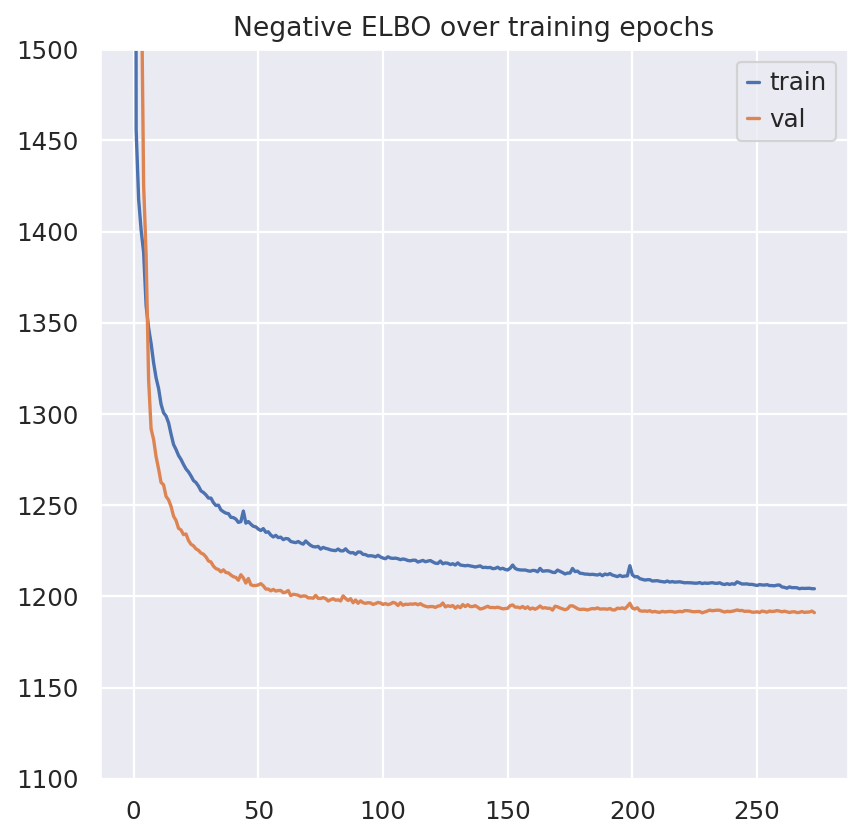

In [14]:
plt.plot(model.history["elbo_train"], label="train")
plt.plot(model.history["elbo_validation"], label="val")
plt.title("Negative ELBO over training epochs")
plt.ylim(1100, 1500)
plt.legend()

## Analyze outputs

Again, we rely on Scanpy.

In [16]:
TOTALVI_LATENT_KEY = "X_totalVI"
PROTEIN_FG_KEY = "protein_fg_prob"

adata.obsm[TOTALVI_LATENT_KEY] = model.get_latent_representation()
adata.obsm[PROTEIN_FG_KEY] = model.get_protein_foreground_probability(transform_batch="PBMC10k")

rna, protein = model.get_normalized_expression(
    transform_batch="PBMC10k", n_samples=25, return_mean=True
)

```{note}
`transform_batch` is a powerful parameter. Setting this allows one to predict the expression of cells as if they came from the inputted batch. In this case, we've observed protein expression in batch "PBMC10k" (batch categories from original adata object), but we have no protein expression in batch "PBMC5k". We'd like to take the cells of batch "PBMC5k" and make a counterfactual prediction: "What would the expression look like if my batch "PBMC5k" cells came from batch "PBMC10k"?"
```

In [17]:
protein.iloc[:5, :5]

,CD3_TotalSeqB,CD4_TotalSeqB,CD8a_TotalSeqB,CD14_TotalSeqB,CD15_TotalSeqB
index,,,,,
AAACCCAAGATTGTGA-1,51.238392,550.340210,8.461351,2324.852539,265.324829
AAACCCACATCGGTTA-1,87.068710,513.493286,8.209779,1888.677002,283.094391
AAACCCAGTACCGCGT-1,42.003422,920.169312,4.047051,3133.992920,299.796356
AAACCCAGTATCGAAA-1,17.271986,9.909242,61.121147,0.326273,296.618622
AAACCCAGTCGTCATA-1,4.649026,0.142651,147.612030,0.022528,247.289551


```{important}
The following is for illustrative purposes. In the code blocks above, we have the denoised protein values for each cell. These values have the expected protein background component removed. However, to compare to the held out protein values, we must include both protein foreground and background. We recommend using the values above for downstream tasks.
```

In [18]:
_, protein_means = model.get_normalized_expression(
    n_samples=25,
    transform_batch="PBMC10k",
    include_protein_background=True,
    sample_protein_mixing=False,
    return_mean=True,
)

In [19]:
TOTALVI_CLUSTERS_KEY = "leiden_totalVI"

sc.pp.neighbors(adata, use_rep=TOTALVI_LATENT_KEY)
sc.tl.umap(adata, min_dist=0.4)
sc.tl.leiden(adata, key_added=TOTALVI_CLUSTERS_KEY)

/tmp/ipykernel_474784/681923621.py:5: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.


/config/workspace/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
/config/workspace/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.


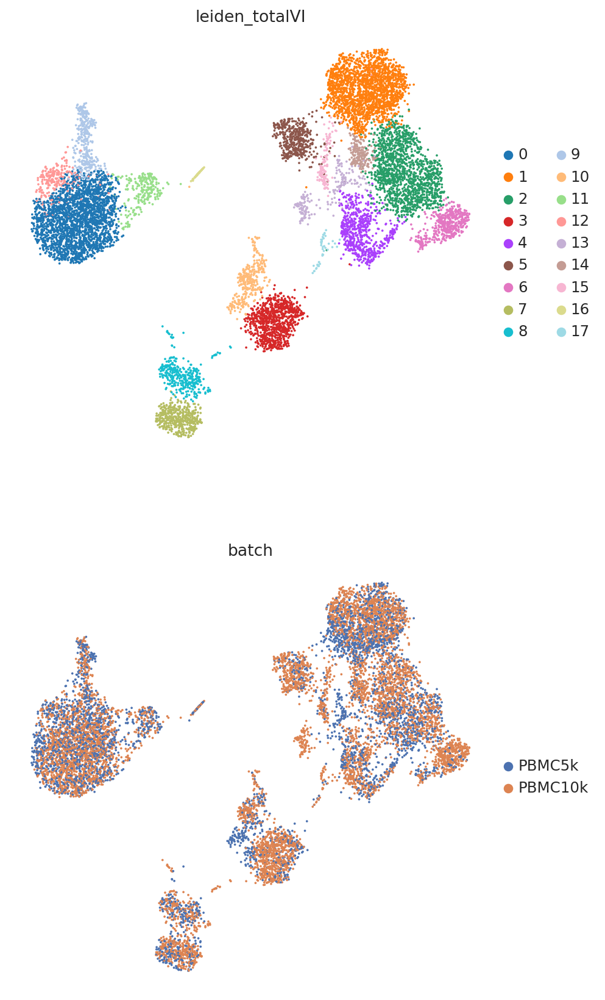

In [20]:
perm_inds = np.random.permutation(len(adata))
sc.pl.umap(
    adata[perm_inds],
    color=[TOTALVI_CLUSTERS_KEY, "batch"],
    ncols=1,
    frameon=False,
)

In [21]:
batch = adata.obs.batch.values.ravel()
combined_protein = np.concatenate(
    [adata.obsm["protein_expression"].values[batch == "PBMC10k"], held_out_proteins],
    axis=0,
)

# cleaner protein names
parsed_protein_names = [p.split("_")[0] for p in adata.obsm["protein_expression"].columns]
for i, p in enumerate(parsed_protein_names):
    adata.obs[f"{p} imputed"] = protein_means.iloc[:, i]
    adata.obs[f"{p} observed"] = combined_protein[:, i]

/config/workspace/.venv/lib/python3.10/site-packages/anndata/_core/anndata.py:1138: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


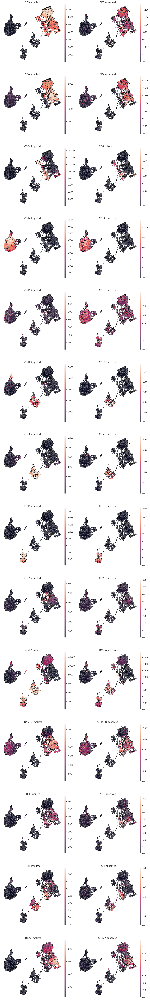

In [22]:
viz_keys = []
for p in parsed_protein_names:
    viz_keys.append(p + " imputed")
    viz_keys.append(p + " observed")

sc.pl.umap(
    adata[adata.obs.batch == "PBMC5k"],
    color=viz_keys,
    ncols=2,
    vmax="p99",
    frameon=False,
    add_outline=True,
    wspace=0.1,
)

## Imputed vs denoised correlations

In [23]:
imputed_pros = protein_means[batch == "PBMC5k"]
held_vs_denoised = pd.DataFrame()
held_vs_denoised["Observed (log)"] = np.log1p(held_out_proteins.values.ravel())
held_vs_denoised["Imputed (log)"] = np.log1p(imputed_pros.to_numpy().ravel())
protein_names_corrs = []
for i in range(len(parsed_protein_names)):
    protein_names_corrs.append(
        parsed_protein_names[i]
        + ": Corr="
        + str(np.round(pearsonr(held_out_proteins.values[:, i], imputed_pros.iloc[:, i])[0], 3))
    )
held_vs_denoised["Protein"] = protein_names_corrs * len(held_out_proteins)
held_vs_denoised.head()

,Observed (log),Imputed (log),Protein
0,3.258097,4.511335,CD3: Corr=0.785
1,5.105945,6.966641,CD4: Corr=0.871
2,2.833213,4.429532,CD8a: Corr=0.791
3,6.546785,8.200865,CD14: Corr=0.913
4,2.995732,5.797609,CD15: Corr=0.121


We notice that CD15 has a really low correlation (imputation accuracy). Recall that imputation involves a counterfactual query -- "what would the protein expression have been for these cells if they came from the PBMC10k dataset?" Thus, any technical issues with proteins in CD15 in PBMC10k will be reflected in the imputed values. It's the case here that CD15 was not captured as well in the PBMC10k dataset compared to the PBMC5k dataset.

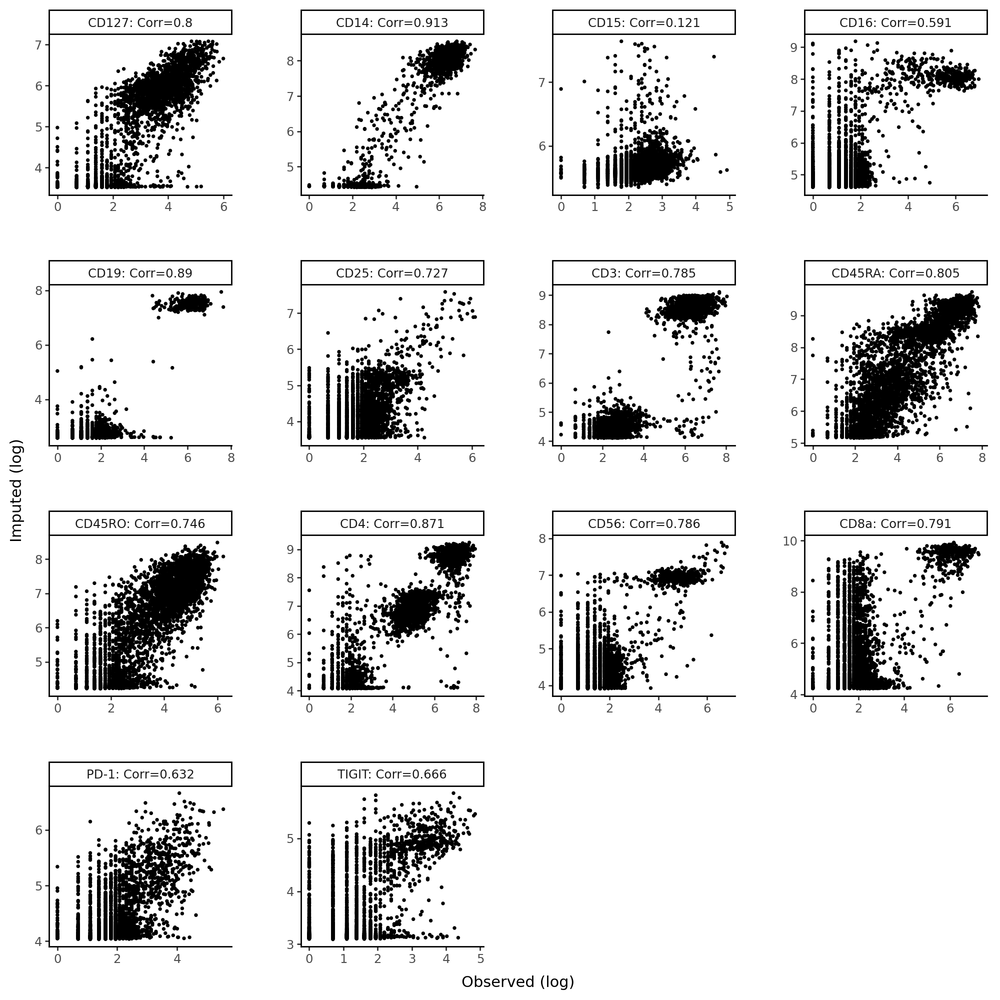

In [24]:
p9.theme_set(p9.theme_classic)
(
    p9.ggplot(held_vs_denoised, p9.aes("Observed (log)", "Imputed (log)"))
    + p9.geom_point(size=0.5)
    + p9.facet_wrap("~Protein", scales="free")
    + p9.theme(
        figure_size=(10, 10),
        panel_spacing=0.05,
    )
)